In [91]:
using CSV
using DelimitedFiles
using DataFrames
using Plots

In [78]:
# ENV["COLUMNS"]=120
# figdir = "figures/";

In [79]:
# include("VirusLoadCurve.jl")
# using .VirusLoadCurve

# Data from

Human SARS-Cov2 data from

*Néant, N., Lingas, G., Le Hingrat, Q., Ghosn, J., Engelmann, I., Lepiller, Q., Gaymard, A., Ferré, V., Hartard, C., Plantier, J. C., Thibault, V., Marlet, J., Montes, B., Bouiller, K., Lescure, F. X., Timsit, J. F., Faure, E., Poissy, J., Chidiac, C., … Guedj, J. (2021). Modeling SARS-CoV-2 viral kinetics and association with mortality in hospitalized patients from the French COVID cohort. Proceedings of the National Academy of Sciences of the United States of America, 118(8). https://doi.org/10.1073/pnas.2017962118


## Data set

In [98]:
RAWDATA = readdlm("../../data/Neant2021/pnas.2017962118.sd01.rev.csv", ',', Any, '\n', header=true)
df = DataFrame(RAWDATA[1], vec(Symbol.(RAWDATA[2])))
dfbg = groupby(df, :unique_ID)

,unique_ID,ID,time_monolix,y,cens,type,age_cat_reg,sex,age_cat_cov
,Any,Any,Any,Any,Any,Any,Any,Any,Any
1,11,11,19,8.57601,0,1,0,0,1
2,11,11,20,6.40197,0,1,0,0,1
3,11,11,21,5.91489,0,1,0,0,1
4,11,11,22,6.22674,0,1,0,0,1
5,11,11,23,2.751,1,1,0,0,1
6,11,11,38,0,0,2,0,0,1
7,11,11,0,0,0,2,0,0,1
,unique_ID,ID,time_monolix,y,cens,type,age_cat_reg,sex,age_cat_cov
,Any,Any,Any,Any,Any,Any,Any,Any,Any


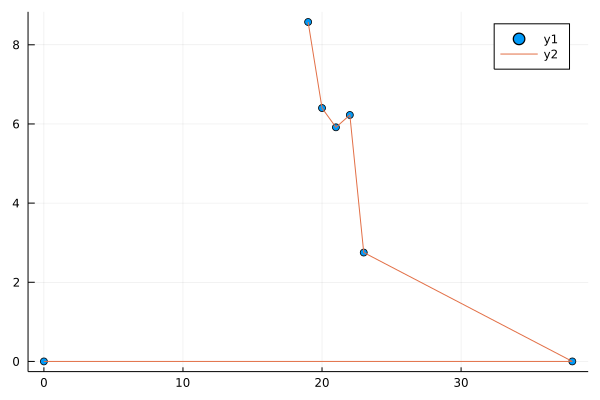

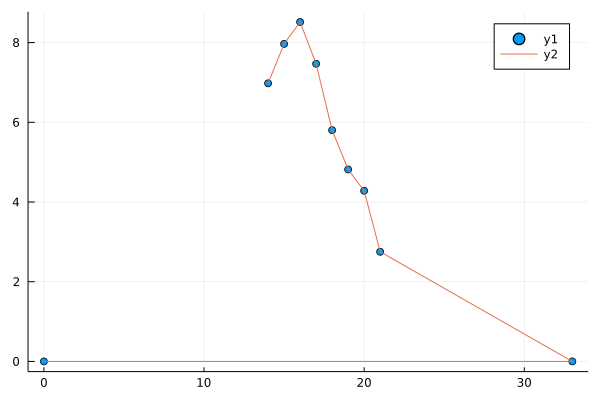

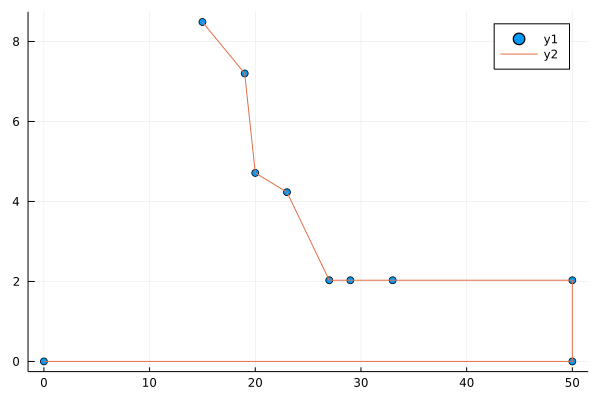

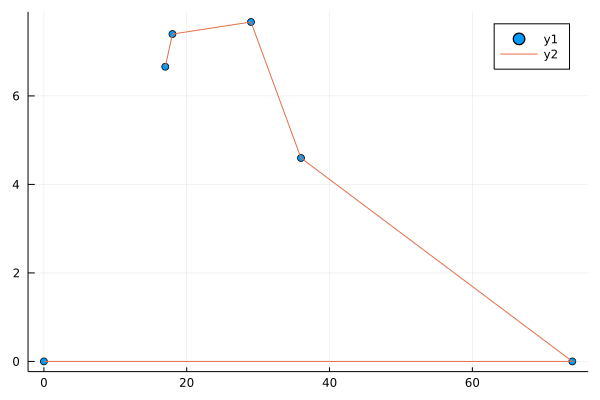

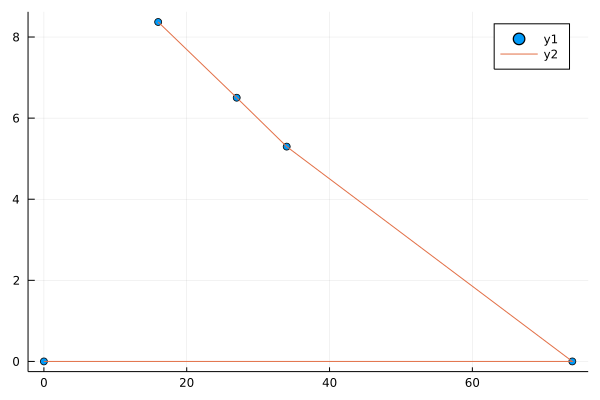

...

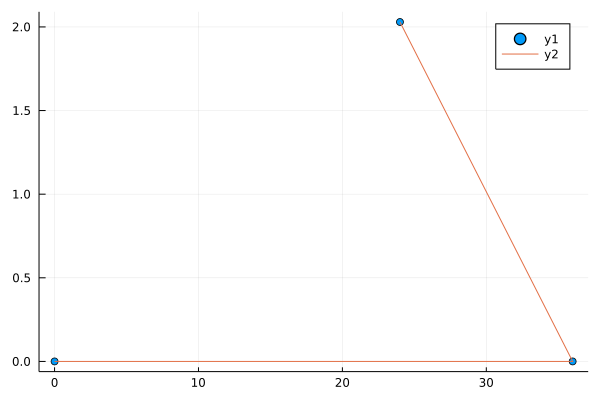

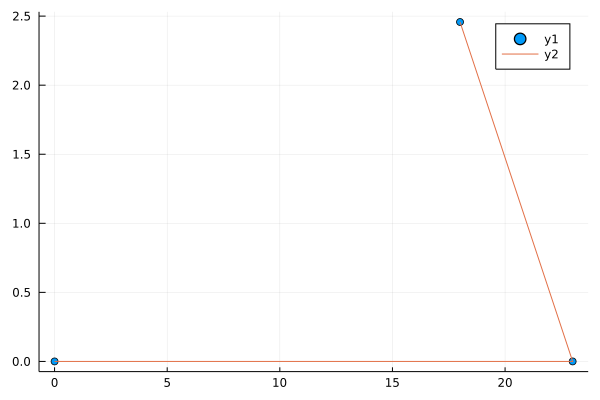

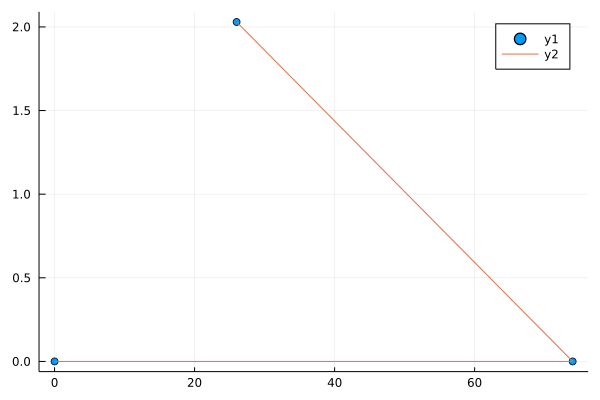

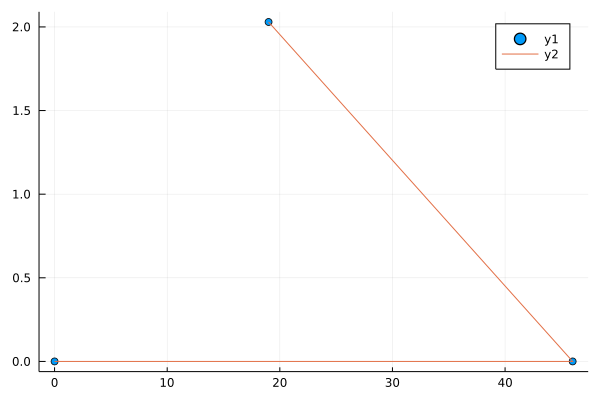

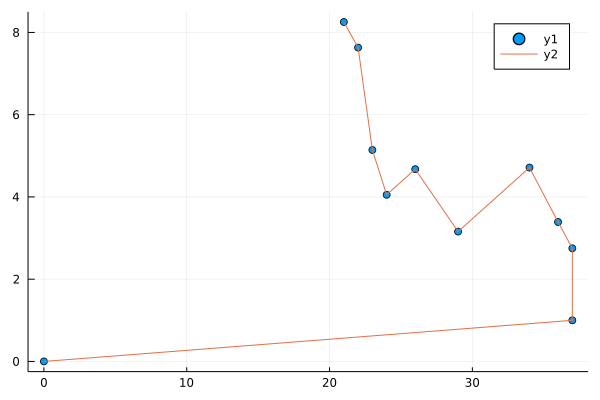

In [99]:
for df ∈ dfbg[1:100]
    pt = plot(df.time_monolix, df.y, seriestype=:scatter)
    plot!(pt, df.time_monolix, df.y)
    display(pt)
end

Data points are all over the place.

### Average of data set


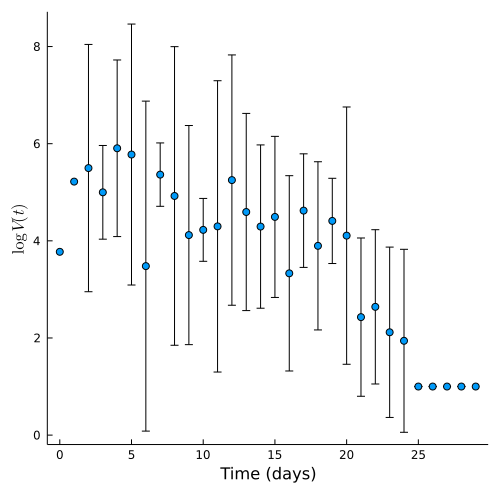

In [7]:
tdata = Float64.(DATA[:, 1])
vdata = [mean(skipmissing(DATA[i, 2:end])) for i in 1:size(DATA, 1)]
vstd = [std(skipmissing(DATA[i, 2:end])) for i in 1:size(DATA, 1)]
vcount = [count(DATA[i, 2:end] .!== missing) for i in 1:size(DATA, 1)]
plot(tdata, vdata, yerrors=vstd,
    seriestype=:scatter, legend=:none, grid=:none, size=(500, 500), 
    xlabel="Time (days)", ylabel=L"\log\,V(t)")
plot!()

Although the average data looks better, it doesn't really make sense to average the virus load per day since the each indivudual responds differently to the virus. This is way the standard deviation is large.

## Fitting the standard virus load function to each individual

Consider a virus load function with three main phases given by

$$V(t)=v_1(t)v_2(t)v_3(t),$$

where $v _1$ describes the initial growth phase between $a _1$ and $a _2$ , $v _2$ the intermediate slow decay
phase between $a _2$ and $b _1$, and $v _3$ the final decay phase between $b _1$ and $b _2$. These functions are given as sigmoid and exponential functions, respectively

$$
\begin{aligned}
v_1(t) & = 1 + \frac{V_{\max} - 1}{2} \left[ \tanh \left( \frac{6}{a_2 - a_1} \left( t - \frac{a_1 + a_2}{2} \right) \right) - \tanh  \left( -3\frac{a_2 + a_1}{a_2 - a_1} \right) \right] \\
v_2(t) & = (1 - H(t - a_2)) + H(t - a_2)e^{-\alpha(t - a_2)} \\
v_3(t) & = 1 - \frac{1 - V_{\min}}{2} \left[ \tanh \left( \frac{6}{b_2 - b_1} \left( t - \frac{b_1 + b_2}{2} \right) \right) - \tanh  \left( -3\frac{b_2 + b_1}{b_2 - b_1} \right) \right],
\end{aligned}
$$

where $H(t)$ denotes the Heaviside function.

In [8]:
DATA[[7,9, 10, 12, 13, 14, 16, 17, 19], 2] .= missing
DATA[[22, 23], 5] .= missing
DATA[[7, 22], 9] .= missing
DATA[[6, ], 11] .= missing
DATA[[25, 26], 16] .= missing
DATA[[17, ], 17] .= missing
DATA[[7, ], 19] .= missing
DATA[[12, ], 20] .= missing
DATA[[9, 10], 21] .= missing
DATA[[1, 30], 2:end] .= 1.;

In [9]:
results = []
tdata = Float64.(DATA[:, 1])
for subject in 2:size(DATA, 2)
    idx = DATA[:, subject] .!== missing
    if sum(idx) < 6
        continue
    end
    ttdata = tdata[idx]
    vvdata = Float64.(DATA[idx, subject])
    data = VirusLoadCurve.VirusLoadData(ttdata, vvdata)
    resultVLF = VirusLoadCurve.fitVLF(data; ϵ=0.2)
    push!(results, resultVLF)
end


Fitting the VLF to data 100%|███████████████████████████| Time: 0:00:39
Finding possible parameter values 100%|█████████████████| Time: 0:00:09


Number of possible parameters found: 226 (out of 1000000 testted)


Fitting the VLF to data 100%|███████████████████████████| Time: 0:00:28
Finding possible parameter values 100%|█████████████████| Time: 0:00:09


Number of possible parameters found: 119890 (out of 1000000 testted)


Fitting the VLF to data 100%|███████████████████████████| Time: 0:00:36
Finding possible parameter values 100%|█████████████████| Time: 0:00:10


Number of possible parameters found: 140413 (out of 1000000 testted)


Fitting the VLF to data 100%|███████████████████████████| Time: 0:00:09
Finding possible parameter values 100%|█████████████████| Time: 0:00:07


Number of possible parameters found: 1 (out of 1000000 testted)


Fitting the VLF to data 100%|███████████████████████████| Time: 0:00:22
Finding possible parameter values 100%|█████████████████| Time: 0:00:10


Number of possible parameters found: 95991 (out of 1000000 testted)


Fitting the VLF to data 100%|███████████████████████████| Time: 0:00:44
Finding possible parameter values 100%|█████████████████| Time: 0:00:09


Number of possible parameters found: 62834 (out of 1000000 testted)


Fitting the VLF to data 100%|███████████████████████████| Time: 0:00:11
Finding possible parameter values 100%|█████████████████| Time: 0:00:07


Number of possible parameters found: 7613 (out of 1000000 testted)


Fitting the VLF to data 100%|███████████████████████████| Time: 0:00:13
Finding possible parameter values 100%|█████████████████| Time: 0:00:08


Number of possible parameters found: 128476 (out of 1000000 testted)


In [9]:
using JLD2, FileIO
# save("To2020Results.jld2", Dict("results" => results))
results = load("To2020Results.jld2", "results");

In [20]:
io = IOBuffer(append=true)
function param_extrema(result)
    param_array = result.param_array
    param = result.fit.param
    if length(param_array)==0 return (param, param) end
    array = map(x -> map(y -> y[x], param_array), 1:length(param_array[1]))
    param_lower = map(minimum, array)
    param_upper = map(maximum, array)
    return (param_lower, param_upper)
end
print(io, @sprintf "\nData & \$V_{\\max}\$ & \$a_1\$ & \$a_2\$ & \$\\alpha\$ & \$b_1\$ & \$b_2\$ & RSS \\\\ \n")
function VLFResultsLatex(dataname, result)
    print(io, @sprintf "%s & " dataname)
#     print(io, @sprintf "%.2f \$\\cdot 10^{%d}\$ & " 10^rem(result.fit.param[6], 1) floor(result.fit.param[6]))
    print(io, @sprintf "%.2f & " result.fit.param[6])
    print(io, @sprintf "%.2f & " result.fit.param[1])
    print(io, @sprintf "%.2f & " result.fit.param[2])
    print(io, @sprintf "%.2f & " result.fit.param[5])
    print(io, @sprintf "%.2f & " result.fit.param[3])
    print(io, @sprintf "%.2f & " result.fit.param[4])
    print(io, @sprintf "%.3f \\\\ \n" sum(abs2, result.fit.resid))
    lower, upper = param_extrema(result)
    print(io, @sprintf "  & ")
#     print(io, @sprintf "(%.2f \$\\cdot 10^{%d}\$, %.2f \$\\cdot 10^{%d}\$) & " 10^rem(lower[6], 1) floor(lower[6]) 10^rem(upper[6], 1) floor(upper[6]))
    print(io, @sprintf "(%.2f, %.2f) & " lower[6] upper[6])
    print(io, @sprintf "(%.2f, %.2f) & " lower[1] upper[1])
    print(io, @sprintf "(%.2f, %.2f) & " lower[2] upper[2])
    print(io, @sprintf "(%.2f, %.2f) & " lower[5] upper[5])
    print(io, @sprintf "(%.2f, %.2f) & " lower[3] upper[3])
    print(io, @sprintf "(%.2f, %.2f) & " lower[4] upper[4])
    print(io, @sprintf "\$\\leq\$ %.3f \\\\ \n" (1.0+0.1)*sum(abs2, result.fit.resid))
end

VLFResultsLatex (generic function with 1 method)

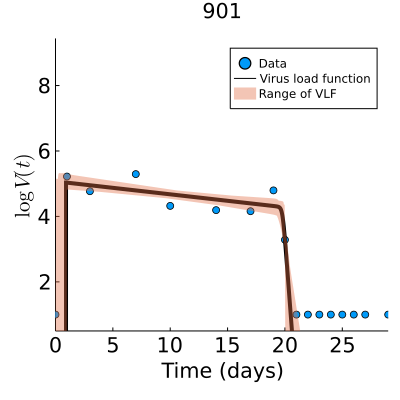


Subject no.: 901
RSS = 8.32390e-01
a₁ = 0.9174420253789735, CI=(0.00020363732370065613, 0.9869093338519779)
a₂ = 0.9174420253789735, CI=(0.055792641638059526, 1.6583648510687143)
b₁ = 19.227523202120135, CI=(18.06771592008043, 19.961703171722384)
b₂ = 20.36097133642435, CI=(20.012863197513973, 20.859281613770065)
α = 0.09126930913477822, CI=(0.04598026508332781, 0.14796938404595378)
logVmax = 5.035795470412709, CI=(4.837702453197845, 5.326366035726484)

Subject no.: 

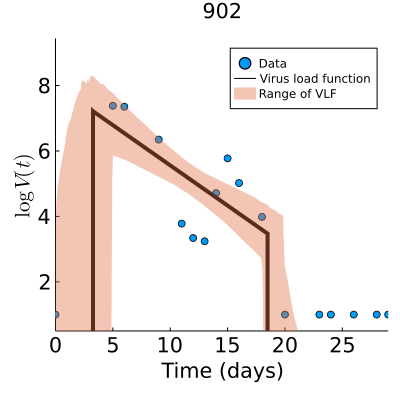

902
RSS = 1.22739e+01
a₁ = 3.2701331738986084, CI=(0.00026155225677726435, 4.997077007571454)
a₂ = 3.2712055288974993, CI=(0.545310075711539, 7.226037004456984)
b₁ = 18.48660479398393, CI=(14.304470774949689, 19.99376151809508)
b₂ = 18.48660479398393, CI=(18.004417304389747, 22.21028932463455)
α = 0.5659784783458908, CI=(0.27678045668508744, 0.8542912156404704)
logVmax = 7.214715157488082, CI=(5.7979258032269945, 8.70146445324641)


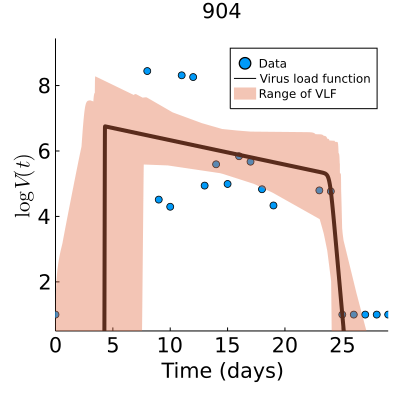


Subject no.: 904
RSS = 3.67542e+01
a₁ = 4.287954734312741, CI=(0.027180581709141727, 7.965926139315853)
a₂ = 4.324110421746297, CI=(1.3912880152289997, 9.39562776320198)
b₁ = 23.229085323511555, CI=(18.66814633370594, 24.994489289498)
b₂ = 24.58292459644694, CI=(23.162694618492715, 26.35165904372023)
α = 0.17171785850123727, CI=(8.922874389138968e-6, 0.5361129369684139)
logVmax = 6.752717981275003, CI=(5.379765429241422, 8.53184240722151)

Subject no.: 

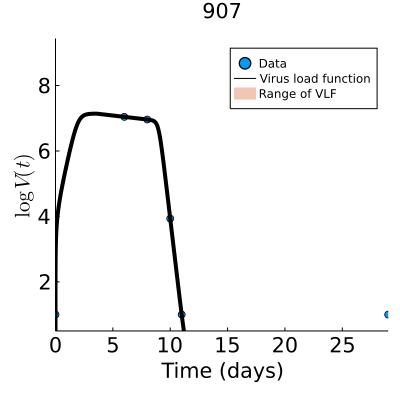

907
RSS = 1.77494e-30
a₁ = 0.3054154112656143, CI=(0.3054154112656143, 0.3054154112656143)
a₂ = 3.5656028762574294, CI=(3.5656028762574294, 3.5656028762574294)
b₁ = 8.103781285170784, CI=(8.103781285170784, 8.103781285170784)
b₂ = 9.884253127915224, CI=(9.884253127915224, 9.884253127915224)
α = 0.09362956069942054, CI=(0.09362956069942054, 0.09362956069942054)
logVmax = 7.142719188860279, CI=(7.142719188860279, 7.142719188860279)


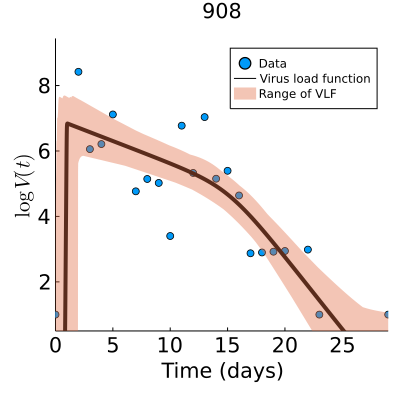


Subject no.: 908
RSS = 2.07736e+01
a₁ = 0.9245499068247898, CI=(8.826107010473372e-6, 1.994698822804106)
a₂ = 1.0427056219444781, CI=(0.009362233041601664, 4.422754278879056)
b₁ = 6.716273964294396, CI=(2.0480565484784723, 11.259063823208246)
b₂ = 23.55539792809875, CI=(19.16081556087474, 28.4211733782857)
α = 0.31141444877176294, CI=(0.0412700304735889, 0.5540780027330863)
logVmax = 6.840096021434663, CI=(5.68390087622832, 7.978009435944838)

Subject no.: 

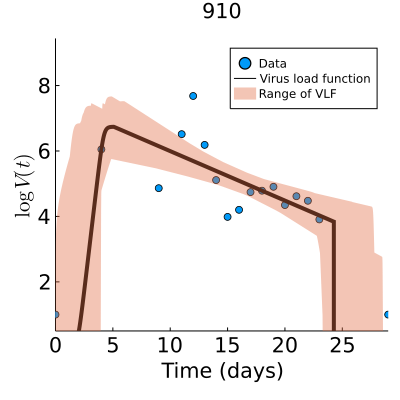

910
RSS = 9.21058e+00
a₁ = 3.319910243846817, CI=(0.006710616217941556, 3.998389176654592)
a₂ = 5.079077400378983, CI=(1.5942731631189337, 9.59880240737742)
b₁ = 24.263309865893593, CI=(19.595397667401286, 28.68492616386577)
b₂ = 24.263309865893593, CI=(23.00808957561032, 28.966257007436976)
α = 0.3482118504977139, CI=(0.1275195650126763, 0.5479303594395732)
logVmax = 6.740134805016841, CI=(5.7101516207027725, 7.919682326868762)


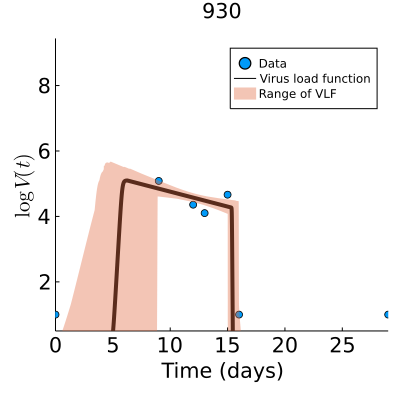


Subject no.: 930
RSS = 3.80628e-01
a₁ = 5.379557177210734, CI=(1.4757889607634196, 8.872784806907765)
a₂ = 6.249995387034772, CI=(3.3411844136820736, 9.834128127257724)
b₁ = 15.316617114664624, CI=(14.49586937342988, 15.984711494525607)
b₂ = 15.43058310107449, CI=(15.012966868056488, 15.996812547092425)
α = 0.210003712061192, CI=(0.06422910933483622, 0.3564234491522118)
logVmax = 5.099460887708941, CI=(4.622842786041368, 5.887294655105497)

Subject no.: 

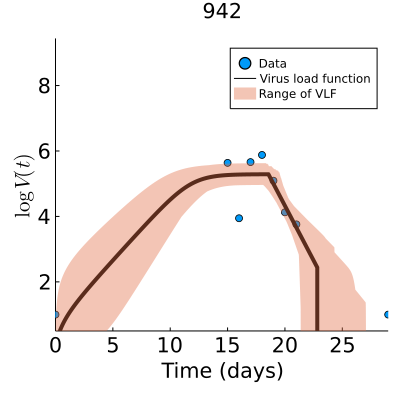

942
RSS = 2.46967e+00
a₁ = 5.0597226081838445, CI=(0.10147622372130005, 10.22929464081875)
a₂ = 18.5615289441248, CI=(17.376434072148495, 19.687201005154073)
b₁ = 22.818962909300595, CI=(17.913203218446434, 27.933132391971387)
b₂ = 22.818962909300595, CI=(21.023234733229632, 28.16050737289098)
α = 1.541895139027465, CI=(0.5665446880307752, 3.150832334566521)
logVmax = 5.289847113619403, CI=(4.94300241274927, 5.638305831430987)

Data & $V_{\max}$ & $a_1$ & $a_2$ & $\alpha$ & $b_1$ & $b_2$ & RSS \\ 
901 & 5.04 & 0.92 & 0.92 & 0.09 & 19.23 & 20.36 & 0.832 \\ 
  & (4.84, 5.33) & (0.00, 0.99) & (0.06, 1.66) & (0.05, 0.15) & (18.07, 19.96) & (20.01, 20.86) & $\leq$ 0.916 \\ 
902 & 7.21 & 3.27 & 3.27 & 0.57 & 18.49 & 18.49 & 12.274 \\ 
  & (5.80, 8.70) & (0.00, 5.00) & (0.55, 7.23) & (0.28, 0.85) & (14.30, 19.99) & (18.00, 22.21) & $\leq$ 13.501 \\ 
904 & 6.75 & 4.29 & 4.32 & 0.17 & 23.23 & 24.58 & 36.754 \\ 
  & (5.38, 8.53) & (0.03, 7.97) & (1.39, 9.40) & (0.00, 0.54) & (18.67, 24.99) & (23

In [21]:
tdata = Float64.(DATA[:, 1])
COLS = [901, 902, 904, 907, 908, 910, 930, 942]
subject = 1
for resultVLF ∈ results
    println("\nSubject no.: ", COLS[subject])
    summary(resultVLF)
    VLFResultsLatex(COLS[subject], resultVLF)
    pt = plot(resultVLF.data, size = (400, 400))
    plot!(pt, resultVLF)
    ylims!(pt, vlims)
    title!(pt, string(COLS[subject]))
    savefig(figdir*"To2020-"*string(subject, pad=2)*".png")
    savefig(figdir*"To2020-"*string(subject, pad=2)*".pdf")
    display(pt)
    subject = subject + 1
end
print(read(io, String))

In [16]:
function Boxplots(results)
    ndata = length(results)
    params = []
    for resultVLF ∈ results
        params = vcat(params, resultVLF.fit.param)
    end
    params = reshape(params, (6, ndata))
    param_names = results[1].names
    pt1 = plot(yaxis=("Time (days)", extrema(params[1:4, :]) .+ (-0.5, 0.5), font(14)), 
        xaxis=("Parameter", font(14)), 
        grid=false, legend=false, left_margin = 5Plots.mm, right_margin = 16Plots.mm)
    [boxplot!(pt1, repeat([param_names[i]], ndata), params[i, :], fillalpha=0.7, lw=2, color=1) for i = 1:4]
    [dotplot!(pt1, repeat([param_names[i]], ndata), params[i, :], marker=(:black, stroke(0))) for i = 1:4]
    pt2 = twinx()
    plot!(pt2, yaxis=("Decay rate (1/days)", extrema(params[5, :]) .+ (-0.2, 0.2), font(14)), 
        xaxis=("", font(14)), 
        grid=false, legend=false, left_margin = 5Plots.mm, right_margin = 16Plots.mm)
    boxplot!(pt2, repeat([param_names[5]], ndata), params[5, :], fillalpha=0.7, lw=2, color=2)
    dotplot!(pt2, repeat([param_names[5]], ndata), params[5, :], marker=(:black, stroke(0)))
    pt1
end

Boxplots (generic function with 1 method)

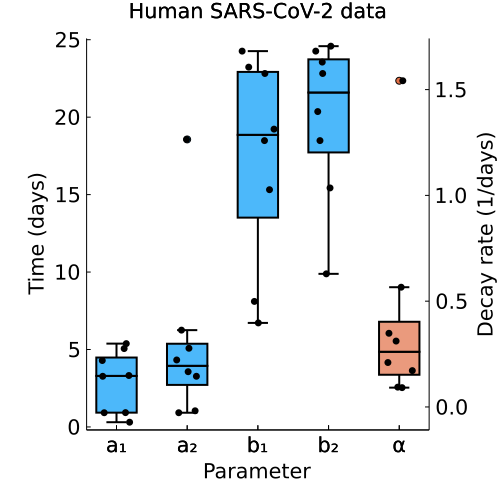

In [17]:
text_data = "Human SARS-CoV-2 data"
text_file = "To2020-Boxplot"
pt = Boxplots(results)
plot!(title = text_data, size=(500, 500))
savefig(figdir*text_file*".pdf")
savefig(figdir*text_file*".png")
display(pt)